## Cityscapes FCN-8s Model for Semantic Segmentation

### Building and Training

The <a href="https://www.cityscapes-dataset.com">Cityscapes Dataset</a> focuses on semantic understanding of urban street scenes"

Contains more than 5,000 pictures with fine-grained semantic labels / 20,000 pictures with coarser annotations, shot from cars driving around ~50 cities in Germany

In [19]:
import os
import collections
import numpy as np
import tensorflow as tf
# tf.config.experimental.set_visible_devices([], 'GPU')
import matplotlib.pyplot as plt
import math

from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.applications.vgg16 import *

seed = 42 # Fixing the seed for PRNGs, to help reproducibility
np.random.seed(seed)
tf.random.set_seed(seed)

In [2]:
# Импорт вспомогательных функций
from utils.plot_utils import plot_image_grid
from utils.keras_custom_callbacks import TensorBoardImageGridCallback
from utils.keras_custom_callbacks import SimpleLogCallback

from cityscapes_utils import (
    CITYSCAPES_FOLDER, # change this variable to Cityscapes root folder
    CITYSCAPES_LABELS, CITYSCAPES_IGNORE_VALUE, 
    cityscapes_input_fn, get_cityscapes_file_pairs, 
    postprocess_to_show)

In [3]:
# Key variables:
batch_size     = 16
num_epochs     = 10
image_size     = [512, 512]
num_channels   = 3
num_classes    = len(CITYSCAPES_LABELS)
random_seed    = 1
num_show       = 3

In [4]:
num_train_imgs = len(get_cityscapes_file_pairs(split='train', 
                                               root_folder=CITYSCAPES_FOLDER)[0])
num_val_imgs   = len(get_cityscapes_file_pairs(split='val', 
                                               root_folder=CITYSCAPES_FOLDER)[0])

train_dataset = cityscapes_input_fn(
    root_folder=CITYSCAPES_FOLDER, resize_to=image_size, batch_size=batch_size,
    shuffle=True, num_epochs=num_epochs, augment=True, seed=random_seed)
val_dataset = cityscapes_input_fn(
    root_folder=CITYSCAPES_FOLDER, resize_to=image_size, batch_size=batch_size,
    shuffle=False, num_epochs=1, augment=False, seed=random_seed)

In [5]:
visual_val_dataset = cityscapes_input_fn(
    root_folder=CITYSCAPES_FOLDER, resize_to=image_size, batch_size=num_show,
    shuffle=True, num_epochs=1, augment=False, seed=random_seed, blurred=True)

val_image_samples, val_gt_samples = next(visual_val_dataset.__iter__())
del visual_val_dataset

In [6]:
# Number of batches per train/val epoch, to guide the Keras `fit` method:
train_steps_per_epoch = math.ceil(num_train_imgs / batch_size)
val_steps_per_epoch   = math.ceil(num_val_imgs / batch_size)

In [7]:
kernel_size    = 4
filters_orig   = 32
layer_depth    = 4
use_batch_norm = batch_size > 1

Модель использует в качестве backend предтренерованную VGG-16

In [8]:
def fcn_8s(image_size, ch_in=3, ch_out=3):
    """
    Build a FCN-8s Keras model, with the VGG-16 layers pretrained on ImageNet.
    :param image_size:  Image size (H x W)
    :param ch_in:       Number of input channels
    :param ch_out:      Number of output channels
    :return:            Keras model
    """
    
    inputs = Input(shape=(*image_size, ch_in), name='input')

    # Building a pre-trained VGG-16 feature extractor (i.e., without the final FC layers)
    vgg16 = VGG16(include_top=False, weights='imagenet', input_tensor=inputs)
    # Recovering the feature maps generated by each of the 3 final blocks:
    f3 = vgg16.get_layer('block3_pool').output  # shape: (28, 28, 256)
    f4 = vgg16.get_layer('block4_pool').output  # shape: (14, 14, 512)
    f5 = vgg16.get_layer('block5_pool').output  # shape: ( 7,  7, 512)

    # Replacing VGG dense layers by convolutions:
    f5_conv1 = Conv2D(filters=4086, kernel_size=7, padding='same',
                      activation='relu')(f5)
    f5_drop1 = Dropout(0.5)(f5_conv1)
    f5_conv2 = Conv2D(filters=4086, kernel_size=1, padding='same',
                      activation='relu')(f5_drop1)
    f5_drop2 = Dropout(0.5)(f5_conv2)
    f5_conv3 = Conv2D(filters=ch_out, kernel_size=1, padding='same',
                      activation=None)(f5_drop2)


    # Using a transposed conv (w/ s=2) to upscale `f5_conv3` into a 14 x 14 map
    # so it can be merged with features from `f4_conv1` obtained from `f4`:
    f5_conv3_x2 = Conv2DTranspose(filters=ch_out, kernel_size=4, strides=2,
                                use_bias=False, padding='same', activation='relu')(f5_conv3)
    # Note: if your machine is not performant enough or if you want to run a lighter version,
    #       you can short-circuit the `f5_convX` layers and directy upscale `f5` instead:
    # f5_conv3_x2 = Conv2DTranspose(filters=ch_out, kernel_size=4, strides=2,
    #                             use_bias=False, padding='same', activation='relu')(f5)
    f4_conv1 = Conv2D(filters=ch_out, kernel_size=1, padding='same',
                      activation=None)(f4)

    # Merging the 2 feature maps (addition):
    merge1 = add([f4_conv1, f5_conv3_x2])

    # We repeat the operation to merge `merge1` and `f3` into a 28 x 28 map:
    merge1_x2 = Conv2DTranspose(filters=ch_out, kernel_size=4, strides=2,
                                use_bias=False, padding='same', activation='relu')(merge1)
    f3_conv1 = Conv2D(filters=ch_out, kernel_size=1, padding='same',
                      activation=None)(f3)
    merge2 = add([f3_conv1, merge1_x2])

    # Finally, we use another transposed conv to decode and up-scale the feature map
    # to the original shape, i.e., using a stride 8 to go from 28 x 28 to 224 x 224 here:
    outputs = Conv2DTranspose(filters=ch_out, kernel_size=16, strides=8,
                              padding='same', activation=None)(merge2)
    
    fcn8s_model = Model(inputs, outputs)
    return fcn8s_model

In [9]:
fcn8s_model = fcn_8s(image_size, num_channels, num_classes)
fcn8s_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 512, 64) 1792        input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 512, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 256, 64) 0           block1_conv2[0][0]               
______________________________________________________________________________________________

### Loss and Metrics

В модели семантической сегментации реализована классификация всех пикселей изображения определенного класса, поэтому функцией потерь служит **кросс-энтропия**

При подсчете метрики пиксели класса, относящиеся к прочим объектам (trainID=255) игнорируются без штрафа модели за их неправильную классификацию 

In [10]:
def get_mask_for_valid_labels(y_true, num_classes, ignore_value=255):
    """
    Build a mask for the valid pixels, i.e. those not belonging to the ignored classes.
    :param y_true:        Ground-truth label map(s) (each value represents a class trainID)
    :param num_classes:   Total nomber of classes
    :param ignore_value:  trainID value of ignored classes (`None` if ignored none)
    :return:              Binary mask of same shape as `y_true`
    """
    mask_for_class_elements = y_true < num_classes
    mask_for_not_ignored = y_true != ignore_value
    mask = mask_for_class_elements & mask_for_not_ignored
    return mask


def prepare_data_for_segmentation_loss(y_true, y_pred, num_classes=10, ignore_value=255):
    """
    Prepare predicted logits and ground-truth maps for the loss, removing pixels from ignored classes.
    :param y_true:        Ground-truth label map(s) (e.g., of shape B x H x W)
    :param y_pred:        Predicted logit map(s) () (e.g., of shape B x H x W x N, N number of classes)
    :param num_classes:   Number of classes
    :param ignore_value:  trainID value of ignored classes (`None` if ignored none) 
    :return:              Tensors edited, ready for the loss computation
    """

    with tf.name_scope('prepare_data_for_loss'):
        # Flattening the tensors to simplify the following operations:
        if len(y_pred.shape) > (len(y_true.shape) - 1):
            y_pred = tf.reshape(y_pred, [-1, num_classes])
        else:
            y_pred = tf.reshape(y_pred, [-1])
        y_true = tf.reshape(tf.cast(y_true, tf.int32), [-1])

        if ignore_value is not None:
            # To compare only on the considered class, we remove all the elements in the images
            # belonging to the ignored ones.
            # For that, we first compute the mask of the pixels belonging to valid labels:
            mask_for_valid_labels = get_mask_for_valid_labels(
                y_true, num_classes, ignore_value=ignore_value)
    
            # Then we use this mask to remove all pixels/elements not belonging to valid classes:
            y_true = tf.boolean_mask(y_true, mask_for_valid_labels, axis=0, name='gt_valid')
            y_pred = tf.boolean_mask(y_pred, mask_for_valid_labels, axis=0, name='pred_valid')

    return y_true, y_pred

In [11]:
class SegmentationLoss(tf.losses.SparseCategoricalCrossentropy):
    def __init__(self, ignore_value=CITYSCAPES_IGNORE_VALUE, 
                 from_logits=False, reduction=tf.losses.Reduction.SUM_OVER_BATCH_SIZE, name='loss'):
        super().__init__(from_logits=from_logits, reduction=reduction, name=name)
        self.ignore_value = ignore_value
    
    def _prepare_data(self, y_true, y_pred):
        num_classes = y_pred.shape[-1]
        y_true, y_pred = prepare_data_for_segmentation_loss(y_true, y_pred,
                                                            num_classes=num_classes, 
                                                            ignore_value=self.ignore_value)
        return y_true, y_pred
    
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_true, y_pred = self._prepare_data(y_true, y_pred)
        loss = super().__call__(y_true, y_pred, sample_weight)
        return loss

In [12]:
class SegmentationAccuracy(tf.metrics.Accuracy):
    def __init__(self, ignore_value=CITYSCAPES_IGNORE_VALUE, name='acc', dtype=None):
        super().__init__(name=name, dtype=dtype)
        self.ignore_value = ignore_value

    def __call__(self, y_true, y_pred, sample_weight=None):
        num_classes = y_pred.shape[-1]
        y_true, y_pred = prepare_data_for_segmentation_loss(y_true, y_pred,
                                                            num_classes=num_classes, 
                                                            ignore_value=self.ignore_value)
        # And since tf.metrics.Accuracy needs the label maps, not the one-hot versions,
        # we adapt accordingly:
        y_pred = tf.argmax(y_pred, axis=-1)
        
        return super().__call__(y_true, y_pred, sample_weight)

In [13]:
class SegmentationMeanIoU(tf.metrics.MeanIoU):
    def __init__(self, num_classes, ignore_value=CITYSCAPES_IGNORE_VALUE, name='mIoU', dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)
        self.ignore_value = ignore_value
        self.num_classes = num_classes

    def __call__(self, y_true, y_pred, sample_weight=None):
        y_true, y_pred = prepare_data_for_segmentation_loss(y_true, y_pred,
                                                            num_classes=self.num_classes, 
                                                            ignore_value=self.ignore_value)
        # And since tf.metrics.mean_iou() needs the label maps, not the one-hot versions,
        # we adapt accordingly:
        y_pred = tf.argmax(y_pred, axis=-1)
        
        return super().__call__(y_true, y_pred, sample_weight)

In [14]:
def predict_and_postprocess(images, gt_labels):
    """
    Use the model to predict the label map, and post-process the data for visualization.
    :param images:      Images
    :param gt_labels:   Ground-truth label maps
    :return:            Images, predicted label maps and GT label maps ready for display
    """

    predicted_onehot = fcn8s_model(images)

    # We convert the predicted logits into categorical results
    # (i.e for each pixel, we assign the class corresponding to the largest logit/probability):
    predicted = tf.math.argmax(predicted_onehot, axis=-1)
    predicted = tf.expand_dims(predicted, axis=-1)

    # Then we post-process the tensors for display:
    images_show, predicted_show, gt_show = postprocess_to_show(
        images, predicted, gt_labels, one_hot=True)
    
    return images_show, predicted_show, gt_show

C:\Users\Nickel\anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


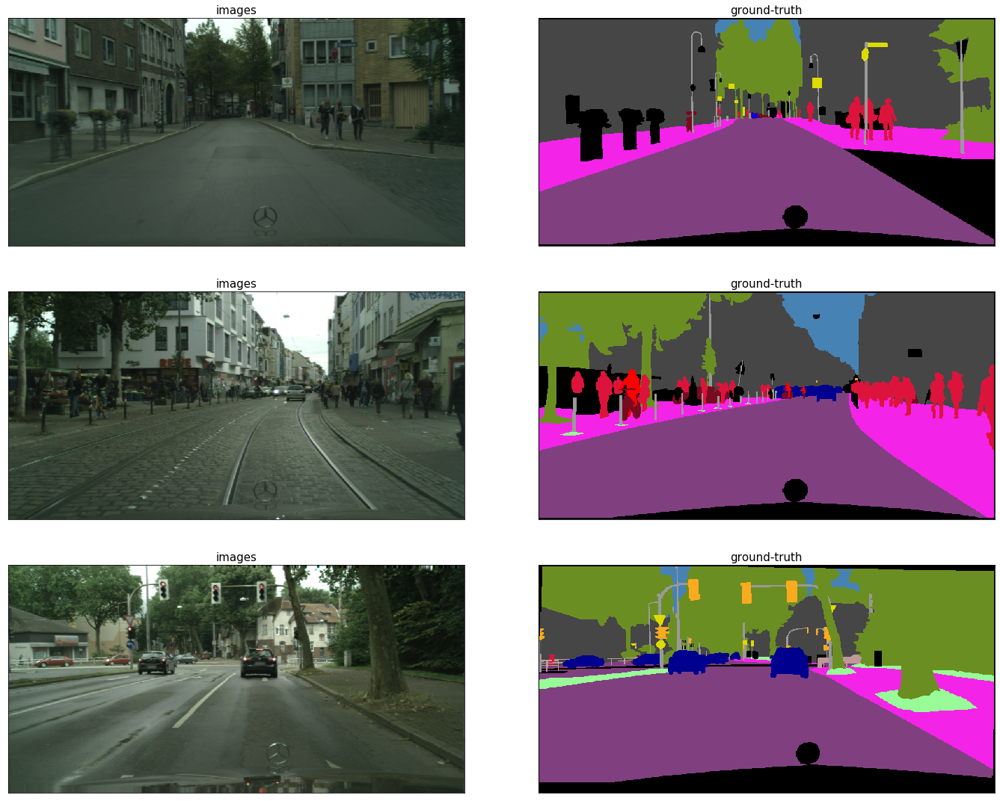

In [15]:
# Simply visualizing the input/target pairs for now:
image_show, predicted_show, gt_show = predict_and_postprocess(val_image_samples, val_gt_samples)

figure = plot_image_grid([image_show.numpy(), gt_show.numpy()], 
                         titles=["images", "ground-truth"])
figure.show()

Подготовка callbacks для отображения в tensorboard

In [16]:
model_name = 'cityscapes_fcn8s'
model_dir = os.path.join('models', model_name)

def postprocess_for_grid_callback(input_images, predicted_images, gt_images):
    
    # We convert the predicted logits into categorical results
    # (i.e for each pixel, we assign the class corresponding to the largest logit/probability):
    predicted_images = tf.math.argmax(predicted_images, axis=-1)
    predicted_images = tf.expand_dims(predicted_images, axis=-1)

    # Then we post-process the tensors for display:
    images_show, predicted_show, gt_show = postprocess_to_show(
        input_images, predicted_images, gt_images, one_hot=True)

    return images_show, predicted_show, gt_show

# Callback to postprocess some validation results and display them in Tensorboard:
callback_tb_grid = TensorBoardImageGridCallback(
    log_dir=model_dir, 
    input_images=val_image_samples, target_images=val_gt_samples, 
    preprocess_fn=postprocess_for_grid_callback,
    tag=model_name + '_results', figsize=(15, 15))

<Figure size 4500x4500 with 0 Axes>

In [17]:
# Callback to simply log metrics at the end of each epoch (saving space compared to verbose=1):
metrics_to_print = collections.OrderedDict([("loss", "loss"), ("v-loss", "val_loss"),
                                            ("acc", "acc"), ("v-acc", "val_acc"),
                                            ("mIoU", "mIoU"), ("v-mIoU", "val_mIoU")])

callback_simple_log = SimpleLogCallback(metrics_to_print, num_epochs=num_epochs)

In [18]:
optimizer = tf.keras.optimizers.Adam()

callbacks = [
    # Callback to interrupt the training if the validation loss stops improving:
    tf.keras.callbacks.EarlyStopping(patience=8, monitor='val_loss',
                                     restore_best_weights=True),
    # Callback to log the graph, losses and metrics into TensorBoard:
    tf.keras.callbacks.TensorBoard(log_dir=model_dir, histogram_freq=0, write_graph=True),
    # Callback to save the model  specifying the epoch and val-loss in the filename:
    tf.keras.callbacks.ModelCheckpoint(
        os.path.join(model_dir, 'weights-epoch{epoch:02d}-loss{val_loss:.2f}.h5'), period=5),
    # Callback to print compacted metrics at the end of each epoch:
    callback_simple_log,
    # Callback to log some validation results as image grids into TensorBoard:
    callback_tb_grid
]

fcn8s_model.compile(optimizer=optimizer, loss=SegmentationLoss(from_logits=True), 
                    metrics=[SegmentationAccuracy(), SegmentationMeanIoU(num_classes)])

history = fcn8s_model.fit(
    train_dataset,  epochs=num_epochs, steps_per_epoch=train_steps_per_epoch,
    validation_data=val_dataset, validation_steps=val_steps_per_epoch,
    verbose=0, callbacks=callbacks)

Training: start.
Training: end.


KeyError: 'loss'